# odp2: Simple Backward Reachability Examples

In [1]:
from math import pi

import numpy as np
from ipywidgets import interact, fixed
import heterocl as hcl

from odp2.model import Model
from odp2.shapes import *
from odp2.solver import HJSolver
from odp2.plot import hj_plot, xy_plot

## Model

In [2]:
class SVEA5D(Model):
    """
    Model for Small Vehicle for Autonomy (SVEA), our hardware platform.
    
    The dynamics are as follows:
    
        x_dot     = v * cos(yaw) + d_1
        y_dot     = v * sin(yaw) + d_2
        yaw_dot   = (v * tan(delta))/L + d3
        delta_dot = u1 + d4
        vel_dot   = u2 + d5
    """

    state_dims = 5
    ctrl_dims = 2
    dstb_dims = state_dims

    wheelbase = 0.32

    X, Y, YAW, DELTA, VEL = range(state_dims)
    STEERING, ACCELERATION = range(ctrl_dims)

    def __init__(self, ctrl_range, dstb_range, mode='reach') -> None:

        self.ctrl_range = np.asarray(ctrl_range)
        assert self.ctrl_range.shape[1] == self.ctrl_dims

        self.dstb_range = np.asarray(dstb_range)
        assert self.dstb_range.shape[1] == self.dstb_dims

        modes = {'reach': {"uMode": "min", "dMode": "max"},
                 'avoid': {"uMode": "max", "dMode": "min"}}
        self.mode = modes[mode]

    def dynamics(self, dx, t, x, u, d):

        # x_dot = v * cos(yaw) + d_1
        dx[self.X] = (x[self.VEL] * hcl.cos(x[self.YAW]) 
                      + d[self.X])

        # y_dot = v * sin(yaw) + d_2
        dx[self.Y] = (x[self.VEL] * hcl.sin(x[self.YAW])
                      + d[self.Y])

        # yaw_dot = (v * tan(delta))/L + d3
        hcl_tan = lambda a: hcl.sin(a) / hcl.cos(a)
        dx[self.YAW] = (x[self.VEL] * hcl_tan(x[self.DELTA])/self.wheelbase
                        + d[self.YAW])

        # delta_dot = u1 + d4
        dx[self.DELTA] = u[self.STEERING] + d[self.DELTA]

        # vel_dot = u2 + d5
        dx[self.VEL] = u[self.ACCELERATION] + d[self.VEL]

    def opt_ctrl(self, u, dv, t, x):

        uMin, uMax = self.ctrl_range
        
        if self.mode['uMode'] == "max":
            # Steering
            with hcl.if_(0 <= x[self.VEL]):
                with hcl.if_(0 <= dv[self.YAW]):
                    u[self.STEERING] = uMax[self.STEERING]
                with hcl.else_():
                    u[self.STEERING] = uMin[self.STEERING]
            with hcl.else_():
                with hcl.if_(0 <= dv[self.YAW]):
                    u[self.STEERING] = uMin[self.STEERING]
                with hcl.else_():
                    u[self.STEERING] = uMax[self.STEERING]
            # Velocity
            with hcl.if_(0 <= dv[self.VEL]):
                u[self.ACCELERATION] = uMax[self.ACCELERATION]
            with hcl.else_():
                u[self.ACCELERATION] = uMin[self.ACCELERATION]            
        else:
            # Steering
            with hcl.if_(0 <= x[self.VEL]):
                with hcl.if_(0 <= dv[self.YAW]):
                    u[self.STEERING] = uMin[self.STEERING]
                with hcl.else_():
                    u[self.STEERING] = uMax[self.STEERING]
            with hcl.else_():
                with hcl.if_(0 <= dv[self.YAW]):
                    u[self.STEERING] = uMax[self.STEERING]
                with hcl.else_():
                    u[self.STEERING] = uMin[self.STEERING]
            # Velocity
            with hcl.if_(0 <= dv[self.VEL]):
                u[self.ACCELERATION] = uMin[self.ACCELERATION]
            with hcl.else_():
                u[self.ACCELERATION] = uMax[self.ACCELERATION]

    def opt_dstb(self, d, dv, t, x):

        dMin, dMax = self.dstb_range

        for i in range(self.dstb_dims):
            if self.mode['dMode'] == "max":
                with hcl.if_(0 <= dv[i]):
                    d[i] = dMax[i]
                with hcl.else_():
                    d[i] = dMin[i]
            else:
                with hcl.if_(0 <= dv[i]):
                    d[i] = dMin[i]
                with hcl.else_():
                    d[i] = dMax[i]


## Global Parameters

In [3]:
# Create model object
model = SVEA5D(ctrl_range=[[-pi/5, -0.5],                   # uMin
                           [+pi/5, +0.5]],                  # uMax
               dstb_range=[[-0.05, -0.05, -pi/20, 0, 0],    # dMin
                           [+0.05, +0.05, +pi/20, 0, 0]],   # dMax
               mode='reach')

# Create time vector
horizon = 5.0
t_step = 0.2
small_number = 1e-5
tau = np.arange(start=0,
                stop=horizon + small_number,
                step=t_step)

# Create grid object
# Dimensions: X, Y, YAW, DELTA, VEL
grid = Grid([41, 41, 31, 11, 11],
            [+4.0, +4.0, +pi, +pi/5, +1],
            [-4.0, -4.0, -pi, -pi/5, -1],
            [False, False, True, False, False])

# Reach Computation Example

In [4]:
# Initial value function / Goal region
goal = cylinder(grid, np.zeros(5), [model.YAW, model.DELTA, model.VEL], 1)

# Extend goal over time axis
# goal = np.concatenate([goal[..., np.newaxis]] * len(tau), axis=-1)

In [5]:
# Create solver object and compute result
solver = HJSolver(grid, tau, model, interactive=True)
result = solver(target=goal, target_mode='min')

== Welcome to optimized_dp ==
Building...
> HJSolver built!

Running...
> Total kernel time: 9.68 s                            



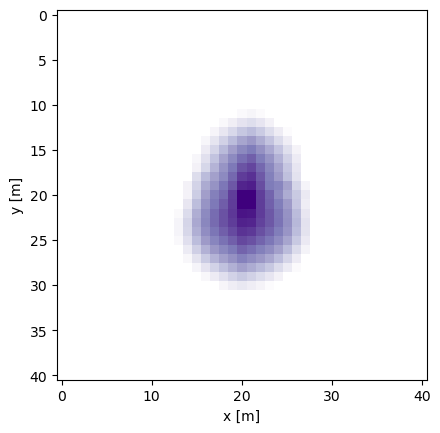

interactive(children=(IntSlider(value=15, description='heading_idx', max=30), IntSlider(value=5, description='…

<function odp2.plot.xy_plot(val_func, grid, heading_idx, steer_idx, vel_idx, time_idx, cmap='Purples')>

In [6]:
interact(xy_plot,
         val_func = fixed(result),
         grid = fixed(grid),
         heading_idx = (0, grid.shape[model.YAW]-1),
         steer_idx = (0, grid.shape[model.DELTA]-1),
         vel_idx = (0, grid.shape[model.VEL]-1),
         time_idx = (0, len(tau)-1))

Plotting beautiful plots. Please wait



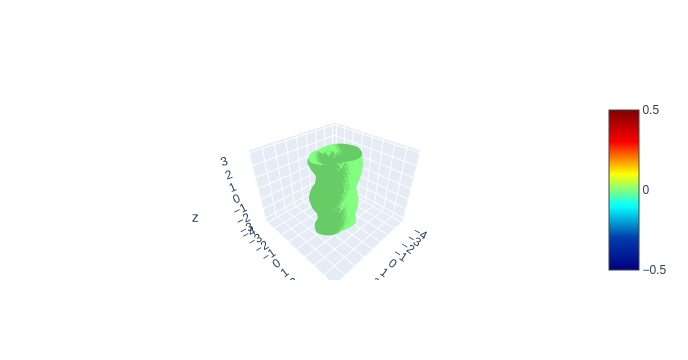

Please check the plot on your browser.


interactive(children=(IntSlider(value=5, description='steer_idx', max=10), IntSlider(value=5, description='vel…

<function odp2.plot.hj_plot(val_func, grid, steer_idx, vel_idx, time_idx)>

In [7]:
interact(hj_plot,
         val_func = fixed(result),
         grid = fixed(grid),
         steer_idx = (0, grid.shape[model.DELTA]-1),
         vel_idx = (0, grid.shape[model.VEL]-1),
         time_idx = (0, len(tau)-1))